In [2]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
from pprint import pprint

from sklearn.manifold import MDS
from adjustText import adjust_text

import os
import sys
from pathlib import Path

# フォルダパスを指定してsys.pathに追加
sys.path.append(str(Path(os.getcwd()).resolve().parent.parent / "func"))

# 関数が格納されているモジュールをインポート
import amalysis

In [3]:
# calculate each paticipant's dissim matrix

raw = str(Path(os.getcwd()).resolve().parent.parent) + '/data/Amy_dissimilarity.csv'
df_raw = pd.read_csv(raw, header=None).T
df_raw.index = ['word1'] + ['word2'] + list(range(1, df_raw.shape[0]-1))
df_raw = df_raw.rename(columns={0:'BDI'})
df_raw.loc['word2', 'BDI'] = np.nan
head = df_raw.iloc[:2, :].copy()
df_raw

,BDI,1,2,3,4,5,6,7,8,9,...,244,245,246,247,248,249,250,251,252,253
word1,BDI,brown,orange,red,black,green,red,envy,fear,pink,...,blue,blue,fear,purple,disgust,calm,orange,green,brown,anxiety
word2,NaN,anger,anxiety,yellow,blue,calm,pink,joy,anger,green,...,envy,anxiety,happiness,confidence,defeated,happiness,pink,disgust,joy,boredom
1,24,7,7,3,3,2,1,4,1,3,...,4,1,7,4,3,1,2,3,4,5
2,11,7,7,6,7,5,6,7,2,6,...,3,4,7,5,5,2,7,7,7,3
3,13,7,6,5,6,2,3,7,5,6,...,7,3,6,7,5,0,7,2,6,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,5,4,5,3,1,1,6,6,2,6,...,5,5,7,7,6,1,5,2,4,4
117,18,6,2,0,0,3,0,2,3,1,...,6,3,7,3,1,1,3,1,6,3
118,5,6,6,2,2,5,1,6,0,2,...,6,6,6,6,6,6,1,6,6,6
119,14,7,3,7,5,3,2,7,2,3,...,7,6,7,4,3,2,3,3,7,7


In [4]:
# Extract the data range and sort by BDI score
df = df_raw.iloc[2:, :].copy()
df = df.sort_values('BDI', ignore_index=True)
df


,BDI,1,2,3,4,5,6,7,8,9,...,244,245,246,247,248,249,250,251,252,253
0,0,3,4,2,2,4,2,6,6,2,...,6,6,7,1,0,1,1,6,6,0
1,0,7,5,5,6,2,2,7,6,7,...,6,5,7,3,3,2,4,5,5,4
2,0,6,6,0,0,2,0,2,1,1,...,7,6,6,7,3,1,0,7,7,5
3,0,7,6,5,3,1,2,7,2,6,...,5,5,7,3,4,1,2,7,6,4
4,0,5,5,0,0,5,0,1,0,0,...,5,5,2,5,2,1,0,5,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,34,7,7,7,3,3,3,7,3,3,...,7,0,7,7,2,0,7,0,7,7
116,36,7,7,6,5,4,2,7,2,5,...,3,6,7,3,2,0,2,1,7,7
117,38,7,7,4,3,3,2,7,3,5,...,5,7,7,2,6,0,1,7,7,4
118,39,7,5,4,4,3,1,7,3,4,...,7,6,5,3,3,2,3,1,7,3


In [5]:
df[df['BDI'] <20]

,BDI,1,2,3,4,5,6,7,8,9,...,244,245,246,247,248,249,250,251,252,253
0,0,3,4,2,2,4,2,6,6,2,...,6,6,7,1,0,1,1,6,6,0
1,0,7,5,5,6,2,2,7,6,7,...,6,5,7,3,3,2,4,5,5,4
2,0,6,6,0,0,2,0,2,1,1,...,7,6,6,7,3,1,0,7,7,5
3,0,7,6,5,3,1,2,7,2,6,...,5,5,7,3,4,1,2,7,6,4
4,0,5,5,0,0,5,0,1,0,0,...,5,5,2,5,2,1,0,5,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,18,6,2,0,0,3,0,2,3,1,...,6,3,7,3,1,1,3,1,6,3
89,18,7,6,2,3,6,0,2,1,3,...,1,0,7,2,2,0,3,6,7,4
90,19,6,2,3,3,3,2,7,3,6,...,2,3,7,2,0,7,4,2,1,7
91,19,7,6,5,5,2,1,6,5,5,...,7,6,7,7,2,4,4,7,7,3


In [6]:
# make dissimilarity matrixes　for each participants
unique_words = np.array(['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'pink', 'brown', 'grey', 'black', 'happiness', 'joy', 'calm', 'confidence', 'envy', 'fear', 'anxiety', 'disgust', 'sadness', 'confusion', 'boredom', 'defeated'])
dissim = []
head = df_raw.iloc[:2, :].copy()
head = head.drop('BDI', axis=1)

for idx in range(len(df)):
    temp = df.iloc[idx:idx+1, :].drop('BDI', axis=1).copy() # make it pd.DataFrame
    temp_target = pd.concat([head, temp])
    dissim_m_temp, _ = amalysis.create_dissimilarity_matrix(temp_target, unique_words)
    dissim.append(dissim_m_temp)

Std matrix: Row 'red', Column 'orange'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'yellow'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'green'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'blue'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'purple'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'pink'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'brown'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'grey'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'black'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'happiness'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'joy'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'calm'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'confidence'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'envy'
Nan values are replaced by 0
Std matrix: Row 'red', Column 'fear'
Nan values are repla

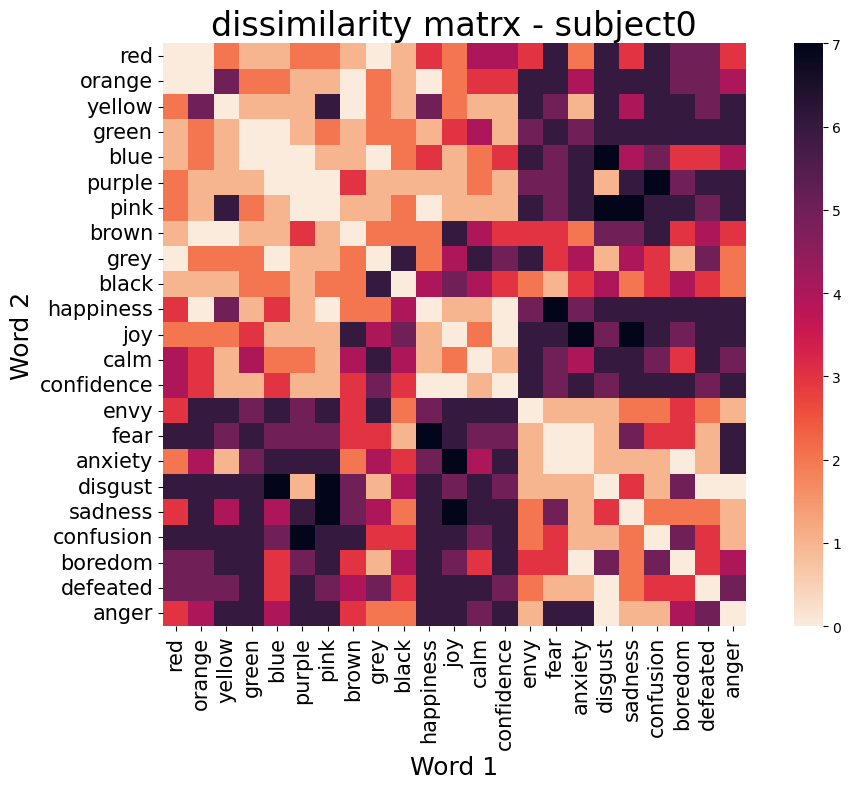

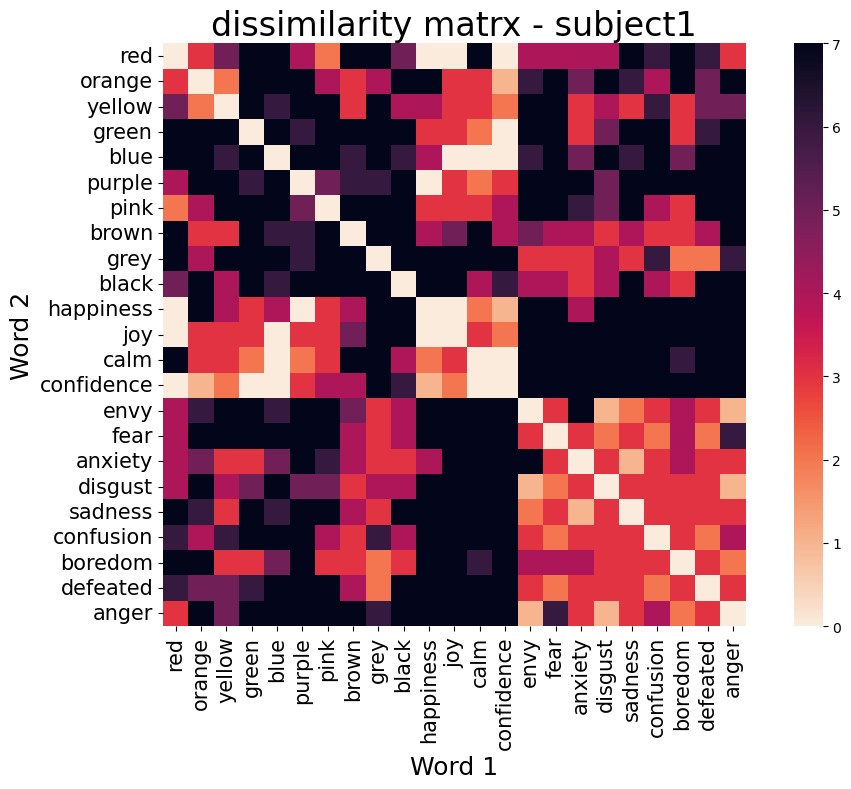

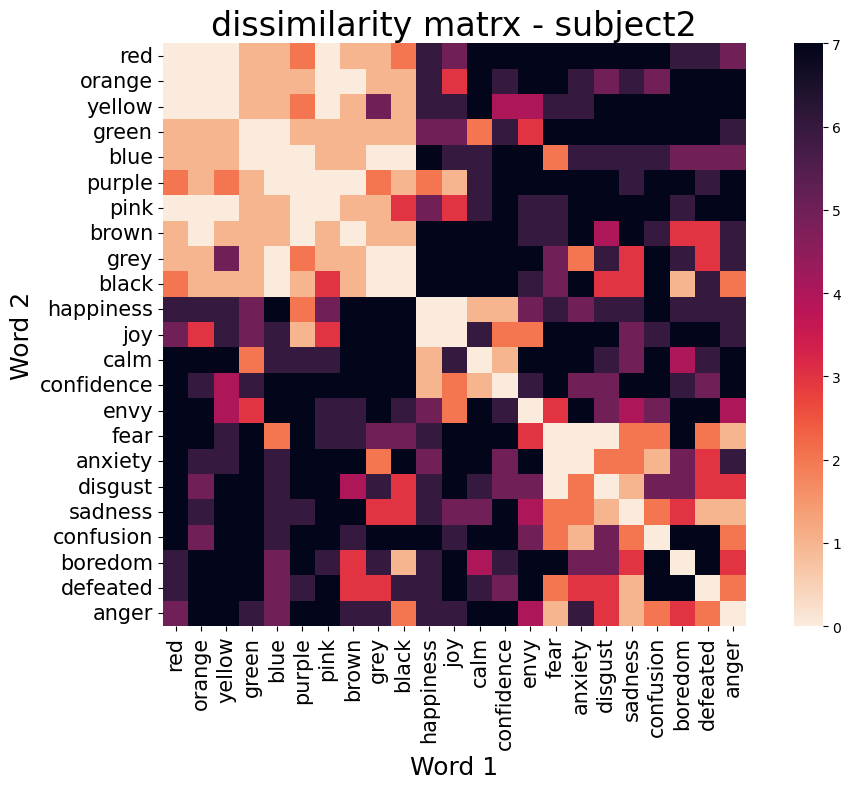

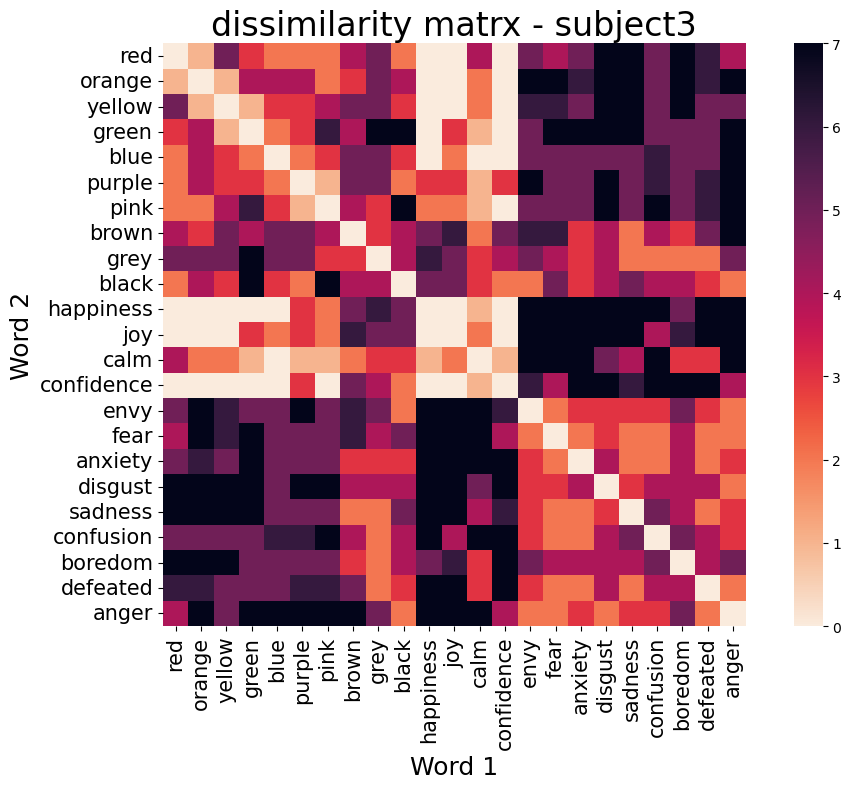

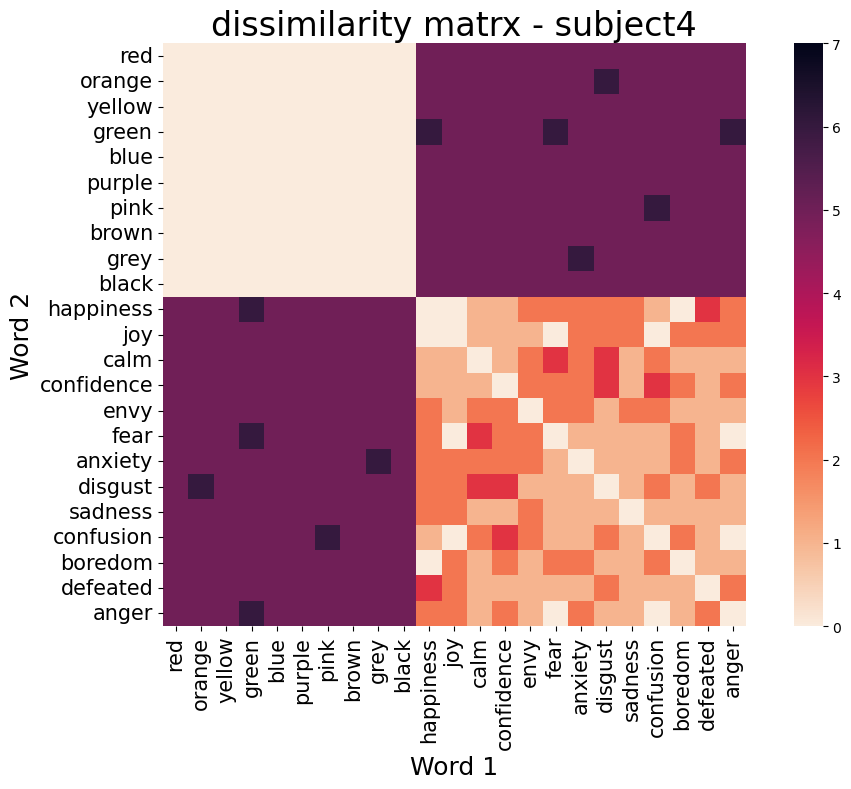

...

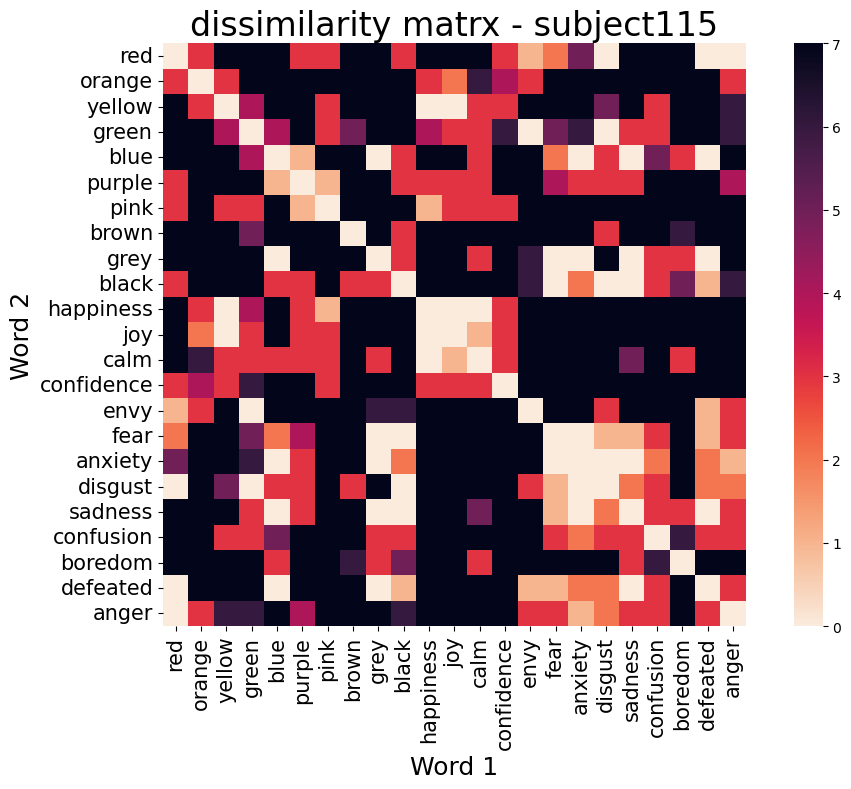

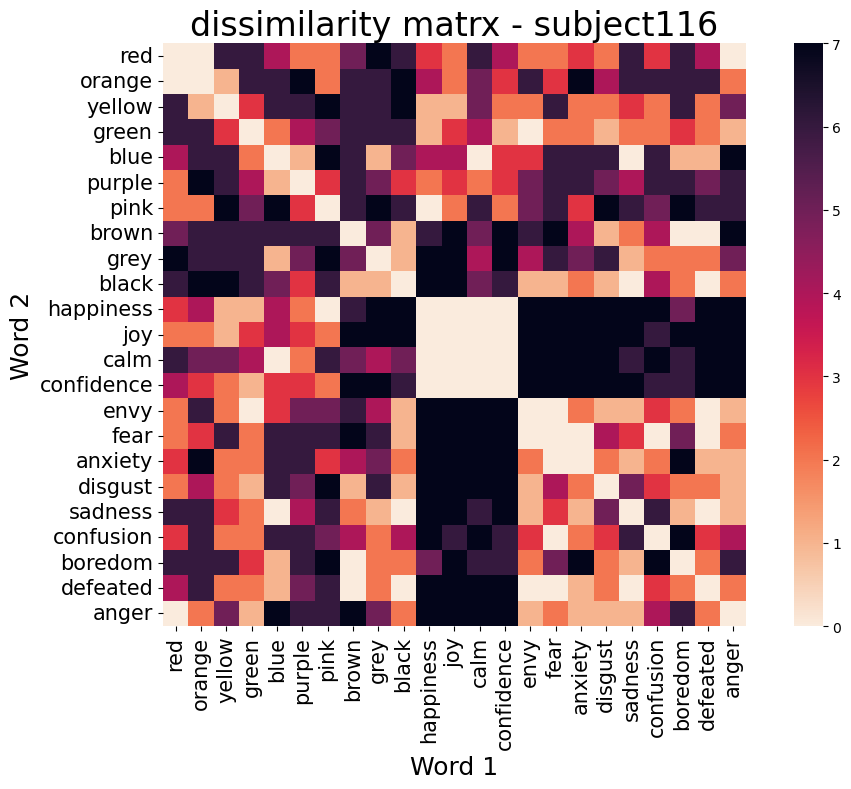

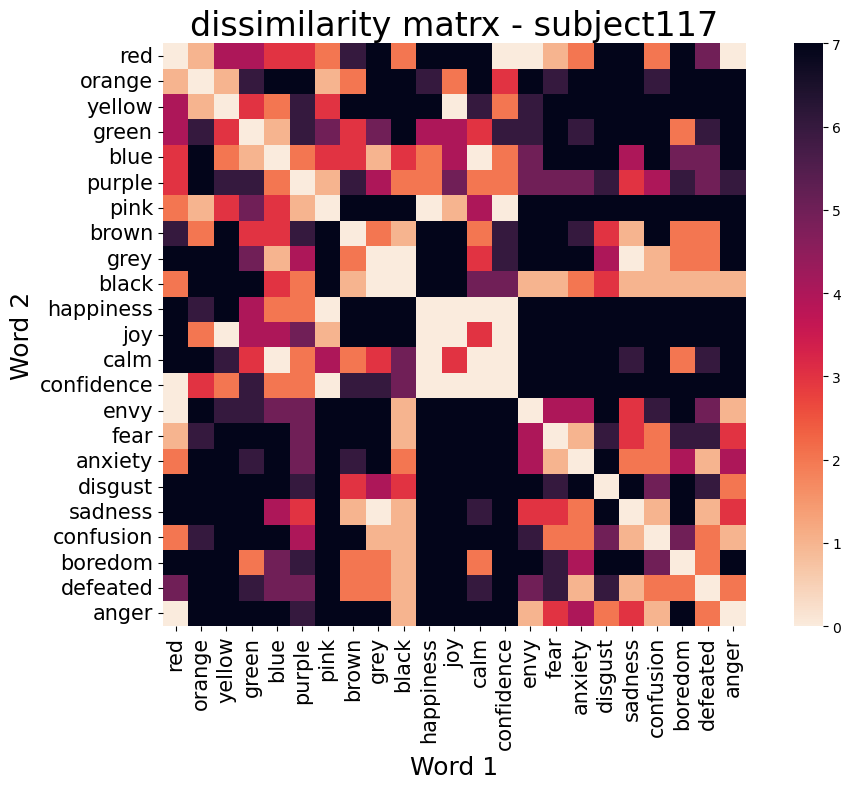

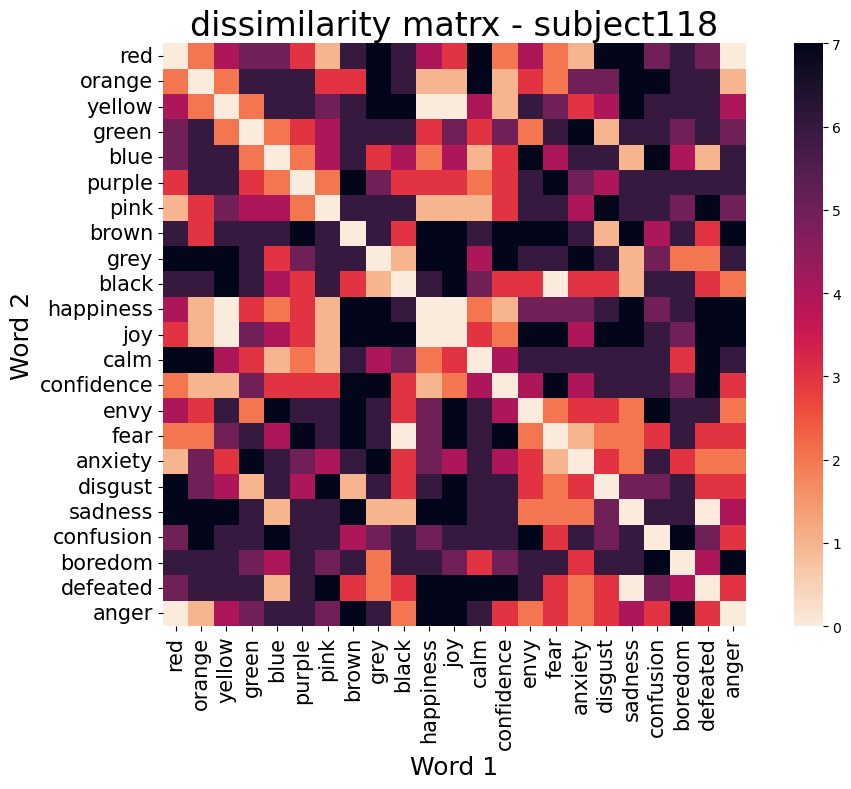

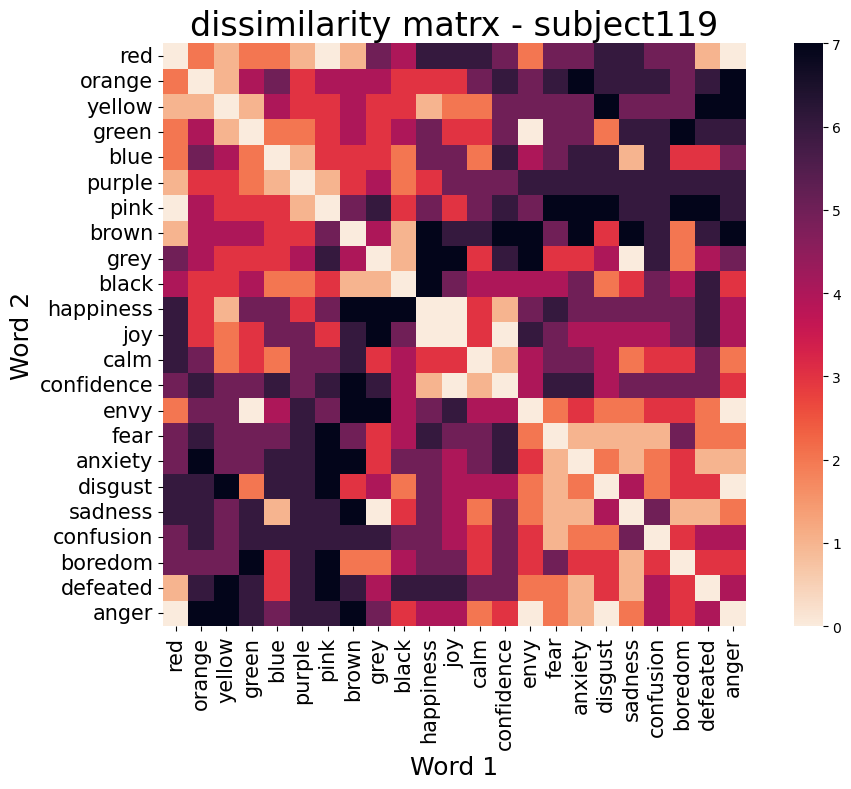

In [7]:
# Draw all participants' dissim
index = np.arange(120)
for idx, group in enumerate(index):
    amalysis.plot_dissimilarity_heatmap(dissim[idx], title=f"dissimilarity matrx - subject{group}")


In [8]:
# calc correlation with all others
# make a vecor for every participants with other's correlation
corr_mat = np.zeros((len(df)+1, len(df)+1))
dfraw_ombdi = df_raw.drop(index=['word1', 'word2'], columns=['BDI']).copy()

for i in range(len(dfraw_ombdi)):
    mean = dfraw_ombdi.drop(index=[i+1]).mean().copy() # index number starts from 1
    
    for j in range(len(dfraw_ombdi)):
        x = dfraw_ombdi.iloc[i, :].copy() # index number starts from 0
        y = dfraw_ombdi.iloc[j, :].copy()
        correlation = x.corr(y) 

        corr_mat[i, j] = correlation
        corr_mat[j, i] = correlation
        
    correlation = x.corr(mean) 
    corr_mat[i, -1] = correlation
    corr_mat[-1, i] = correlation

In [9]:
corr_mat

array([[1.        , 0.42929247, 0.50810793, ..., 0.47369241, 0.54648997,
        0.80975838],
       [0.42929247, 1.        , 0.44356571, ..., 0.34434891, 0.32566849,
        0.52738479],
       [0.50810793, 0.44356571, 1.        , ..., 0.50217561, 0.46181474,
        0.63575098],
       ...,
       [0.47369241, 0.34434891, 0.50217561, ..., 1.        , 0.49726697,
        0.5811848 ],
       [0.54648997, 0.32566849, 0.46181474, ..., 0.49726697, 1.        ,
        0.6396856 ],
       [0.80975838, 0.52738479, 0.63575098, ..., 0.5811848 , 0.6396856 ,
        0.        ]])

In [10]:
emphas_mean = corr_mat[-1, :]
corr_mat_forvis = corr_mat

for i in range(5):
    #corr_mat_forvis = np.insert(corr_mat_forvis, -1, emphas_mean, axis=0)
    corr_mat_forvis = np.insert(corr_mat_forvis, -1, emphas_mean, axis=1)


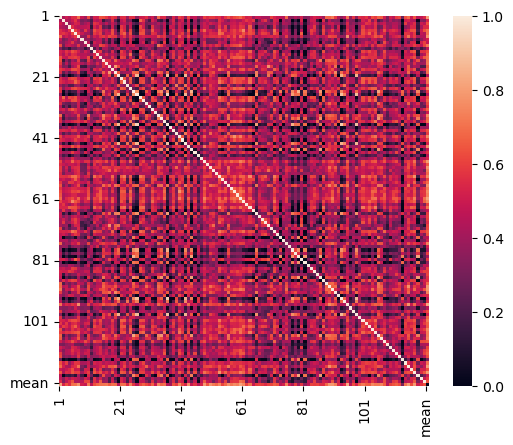

In [11]:
import seaborn as sns

arr = np.arange(120) + 1

label = [str(x) for x in arr] 
label.append('mean')

sns.heatmap(corr_mat, vmin=0, vmax=1, square=True, xticklabels=label, yticklabels=label)

# カスタムラベルの設定
step = 20  # 20個飛ばし
tick_indices = list(range(0, len(label)-1, step)) + [len(label)-1]  # 最後のインデックスを追加
tick_labels = [label[i] for i in tick_indices]

# x軸とy軸の設定
plt.xticks(ticks=tick_indices, labels=tick_labels, rotation=90)
plt.yticks(ticks=tick_indices, labels=tick_labels, rotation=0)

plt.show()

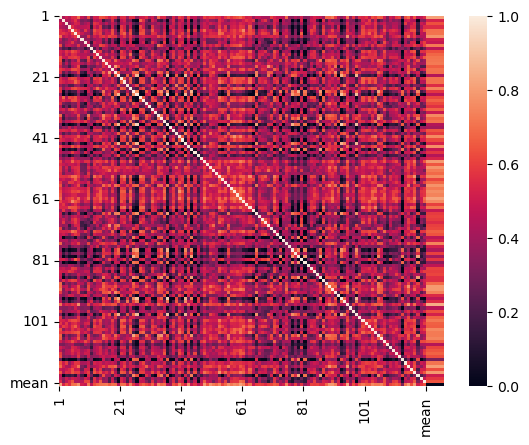

In [12]:
import seaborn as sns

arr = np.arange(120) + 1

label = [str(x) for x in arr] 
label.append('mean')

sns.heatmap(corr_mat_forvis, vmin=0, vmax=1, square=True, xticklabels=label, yticklabels=label)

# カスタムラベルの設定
step = 20  # 20個飛ばし
tick_indices = list(range(0, len(label)-1, step)) + [len(label)-1]  # 最後のインデックスを追加
tick_labels = [label[i] for i in tick_indices]

# x軸とy軸の設定
plt.xticks(ticks=tick_indices, labels=tick_labels, rotation=90)
plt.yticks(ticks=tick_indices, labels=tick_labels, rotation=0)

plt.show()

In [13]:
# MDS for

mds_res = np.zeros((121, 2))
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=0)
mds_res = mds.fit_transform(corr_mat)

AttributeError: 'numpy.ndarray' object has no attribute 'index'

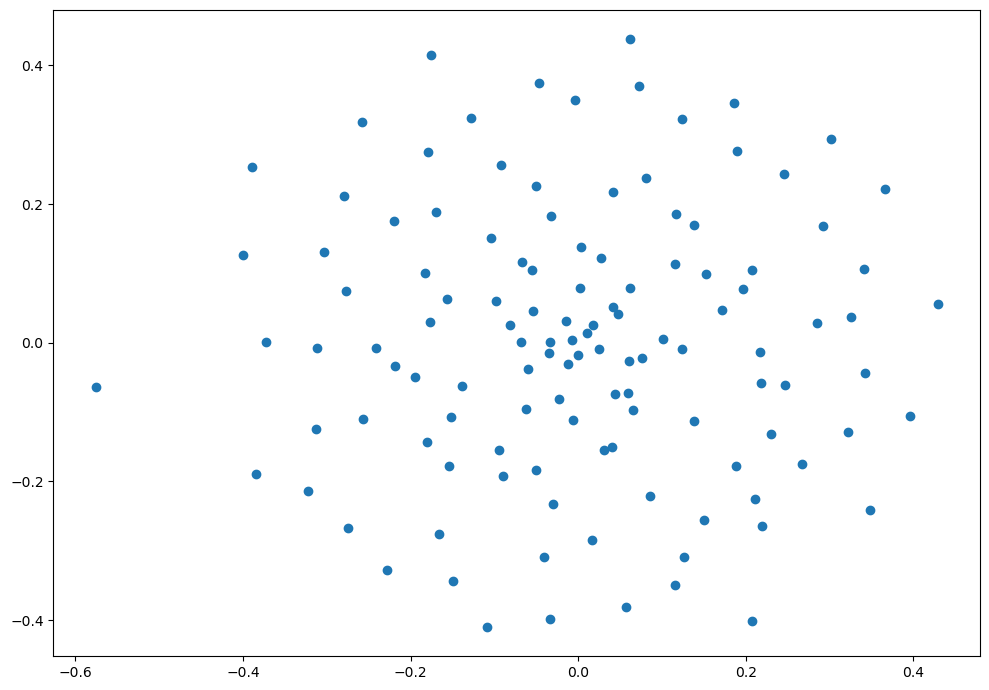

In [111]:
fig, ax = plt.subplots(figsize=(10, 7), tight_layout=True)
ax.scatter(mds_res[:, 0], mds_res[:, 1]) # plt.scatter?

# ラベルを追加
text = [str(i) for i in range(1, 121)] + ["mean"]

# ラベルの重なりを自動調整
adjust_text(texts, only_move={'points': 'xy', 'text': 'xy'}, arrowprops=dict(arrowstyle="->", color='b', lw=1.2))

# 最初の10点を赤い線でつなぐ
#ax.plot(mds_res[:10, 0], mds_res[:10, 1], 'r-', lw=1, label='Colours')

# 次の15点を黒い線でつなぐ
#ax.plot(mds_res[10:25, 0], mds_res[10:25, 1], 'g-', lw=1, label='Emotions')

# 凡例を追加
ax.legend(fontsize=22)
xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()
ax.set_xticklabels(xticklabels,fontsize=15)
ax.set_yticklabels(yticklabels,fontsize=15)
ax.set_xlabel('MDS Dimension 1', fontsize=18)
ax.set_ylabel('MDS Dimension 2', fontsize=18)
ax.set_title(title, fontsize=24)
plt.savefig(f"/home/jovyan/work/fig/{title}", dpi=300)
plt.show()


/tmp/ipykernel_211/4101355203.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(xticklabels, fontsize=15)
/tmp/ipykernel_211/4101355203.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(yticklabels, fontsize=15)


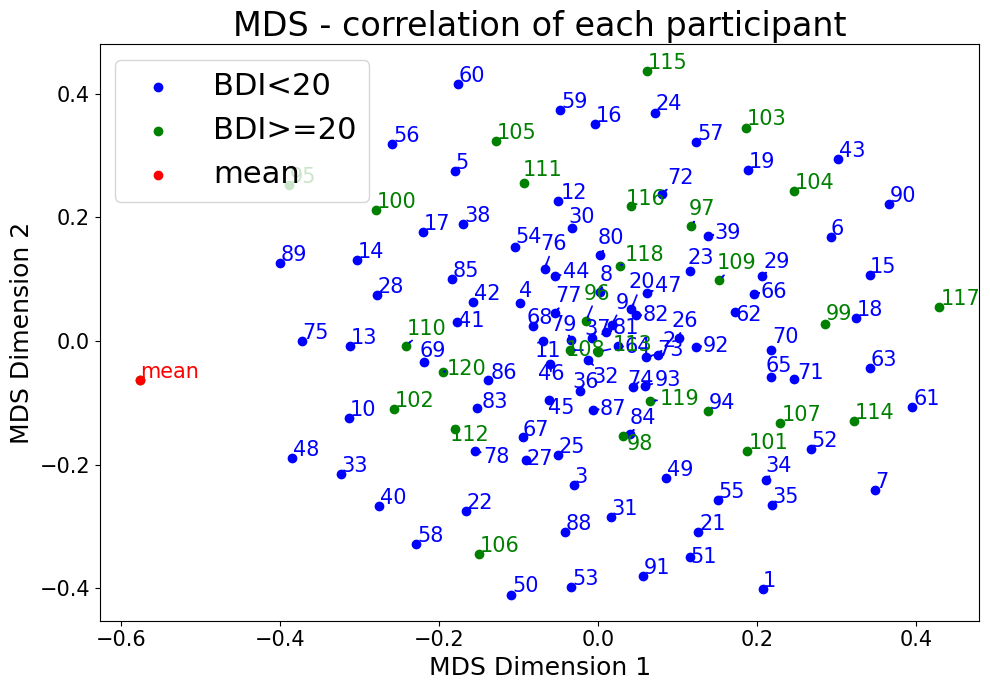

In [18]:
import matplotlib.pyplot as plt
from adjustText import adjust_text
import numpy as np

# ラベルを1~120の数字と"mean"に設定
text = [str(i) for i in range(1, 121)] + ["mean"]

# プロットの設定
fig, ax = plt.subplots(figsize=(10, 7), tight_layout=True)

# 点を色分けして描画
# 0~92の点を青で描画
ax.scatter(mds_res[:93, 0], mds_res[:93, 1], color='blue', label='BDI<20')

# 93~120の点を緑で描画
ax.scatter(mds_res[93:121, 0], mds_res[93:121, 1], color='green', label='BDI>=20')

# 最後の"mean"の点を赤で描画
ax.scatter(mds_res[120, 0], mds_res[120, 1], color='red', label='mean')

# ラベルを追加 - 色を変える
texts = []
for i, word in enumerate(text):
    if i <= 93:  # 0~92のラベルは青
        color = 'blue'
    elif i < 120:  # 93~120のラベルは緑
        color = 'green'
    else:  # "mean"のラベルは赤
        color = 'red'
    texts.append(plt.text(mds_res[i, 0], mds_res[i, 1], word, fontsize=15, color=color))

# ラベルの重なりを自動調整
adjust_text(texts, only_move={'points': 'xy', 'text': 'xy'}, arrowprops=dict(arrowstyle="->", color='b', lw=1.2))

# 凡例を追加
ax.legend(fontsize=22)

# 軸ラベルのフォントサイズを調整
xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()
ax.set_xticklabels(xticklabels, fontsize=15)
ax.set_yticklabels(yticklabels, fontsize=15)

# 軸ラベルとタイトルを設定
ax.set_xlabel('MDS Dimension 1', fontsize=18)
ax.set_ylabel('MDS Dimension 2', fontsize=18)
ax.set_title("MDS - correlation of each participant", fontsize=24)

# 図を保存
plt.savefig(f"/home/jovyan/work/fig/corr_each_par.png", dpi=300)

# 図を表示
plt.show()

